# TP1 Vision por computadora I

## Abraham Rodriguez

# Parte 1
(imágenes en /white_patch y /coord_cromaticas

In [135]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

## Utils

In [136]:
def open_images(path : str, color_scale = cv.COLOR_BGR2RGB) -> list:
    """
    Opens all images from a directory.
    Args:
        path: str -> file path of the directory
    Returns:
        list -> list of image matrices. 
    """
    import os 
    temp = []
    if path.endswith("/"):
        items = os.listdir(path)
    
        for p in items:
            
            if (p.endswith("png") | p.endswith("pg")):

                img = cv.cvtColor(cv.imread(path + p), color_scale)
                temp.append(img)
        return temp
    return cv.cvtColor(cv.imread(path), color_scale)

def show_image_list(images : list, nrows = 1):
    ncols = len(images)
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols, figsize=(12,8))

    axes = axes.ravel()

    for i in range(len(axes)):
       axes[i].set_axis_off()
       axes[i].imshow(images[i])

def show_plots(plots, nrows = 1,figsize=(12,8)):
    ncols = len(plots)
    fig, axes = plt.subplots(nrows=nrows,ncols=ncols, figsize=figsize)

    axes = axes.ravel()

    for i in range(len(axes)):
       axes[i].plot(plots[i])


In [137]:
whites = open_images("./white_patch/")
croms = open_images("./coord_cromaticas/")

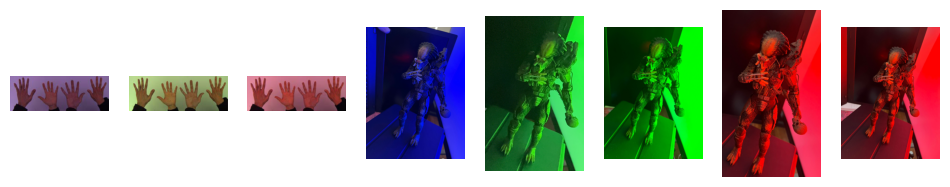

In [138]:
show_image_list(whites)

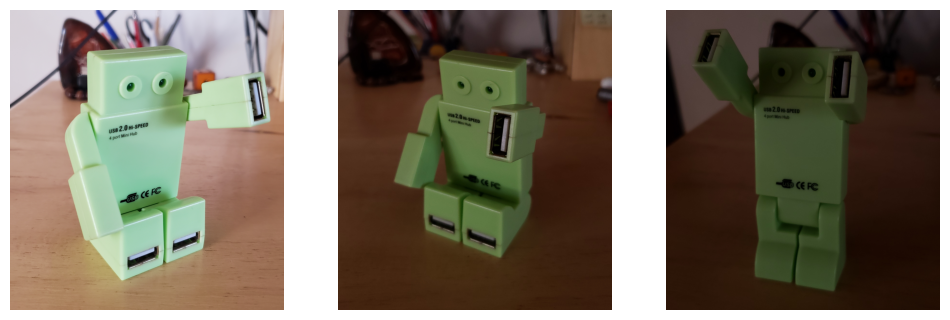

In [139]:
show_image_list(croms)

## Parte I

Implementar el algoritmo de pasaje a coordenadas cromáticas para librarnos de las variaciones de contraste

In [140]:
def cromatic_coords(image : cv.Mat, s= 1) -> cv.Mat:
    r,g,b = cv.split(image)
    sum = s*r + s*g + s*b
    def apply_transform(channel : np.ndarray):
        return np.divide((s*channel), sum, where=sum != 0).clip(0,1)
        
    sr = apply_transform(r)
    sg = apply_transform(g)
    sb = apply_transform(b)
    return cv.merge([sr,sg,sb])

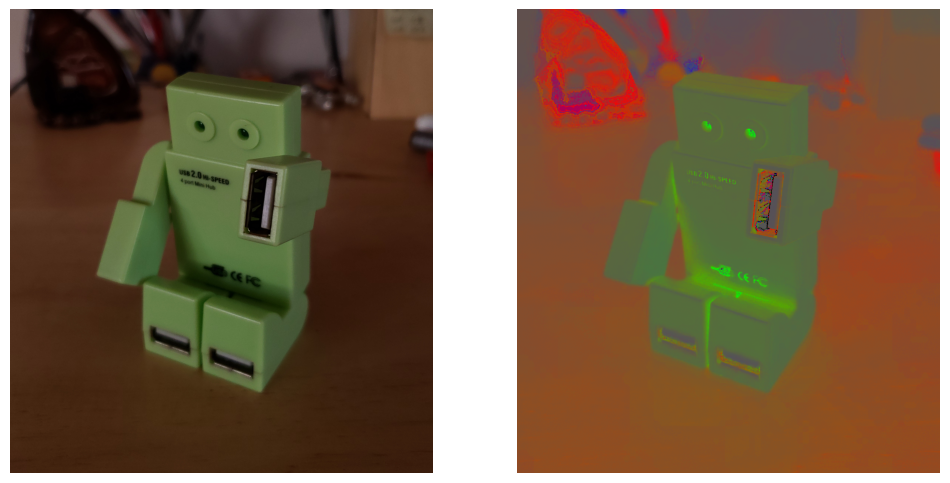

In [141]:
show_image_list([croms[1],cromatic_coords(croms[1],0.1)])

## White patch

In [142]:
def white_patch(image,percentile_value = 99 ):
    """
    Applies white patch algorithm with percentiles
    """
    image =np.asarray(image)
    r,g,b = cv.split(image)

    def norm_channel(channel):
        return ((channel*1.0)/np.percentile(channel, percentile_value, axis=(0,1))).clip(0, 1)
    n_r = norm_channel(r)
    n_g = norm_channel(g)
    n_b = norm_channel(b)
    #n_r,n_g,n_b = [norm_channel(i) for i in [r,g,b]]
    #print(n_b)
    # return             (image*1.0 / np.percentile(image, 
    #         percentile_value, axis=(0, 1))).clip(0, 1)
    return cv.merge([n_r,n_g,n_b])

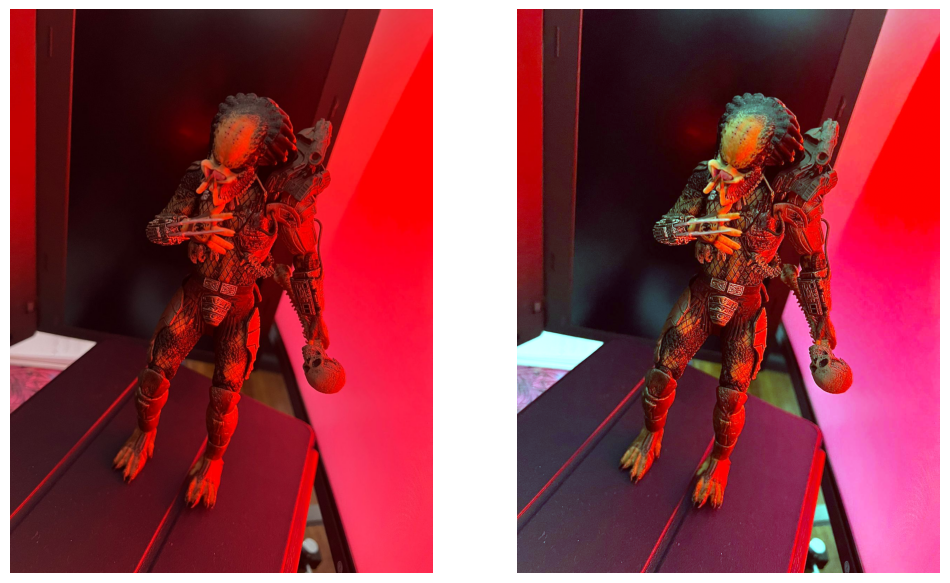

In [143]:
show_image_list([whites[7],white_patch(whites[7],99)])

## whitepatch aplicado a todas las images

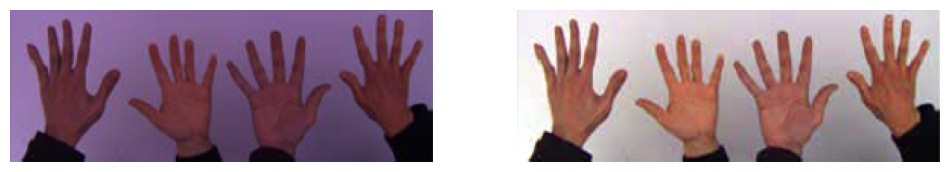

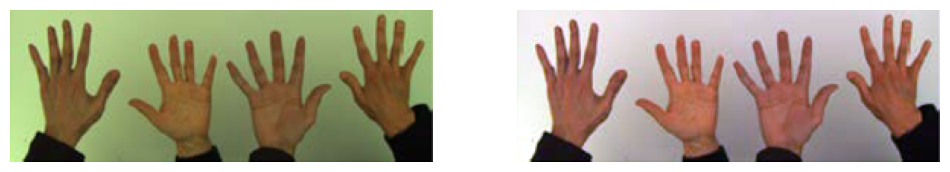

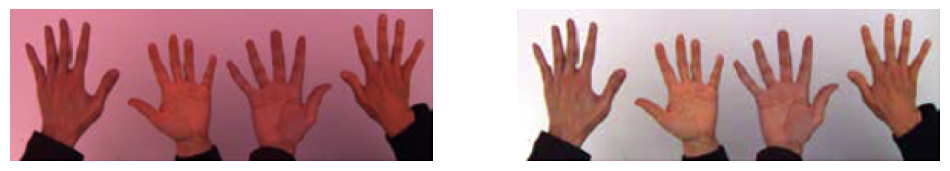

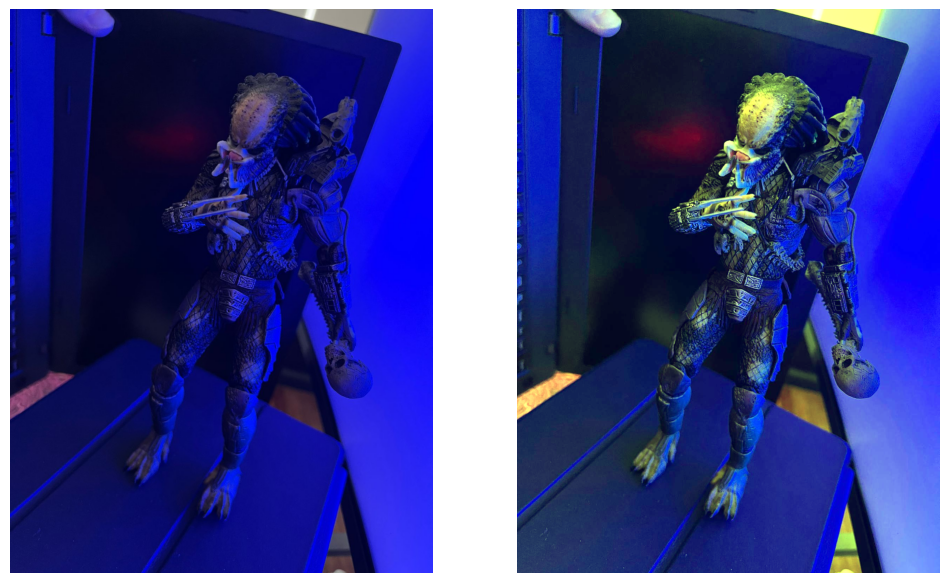

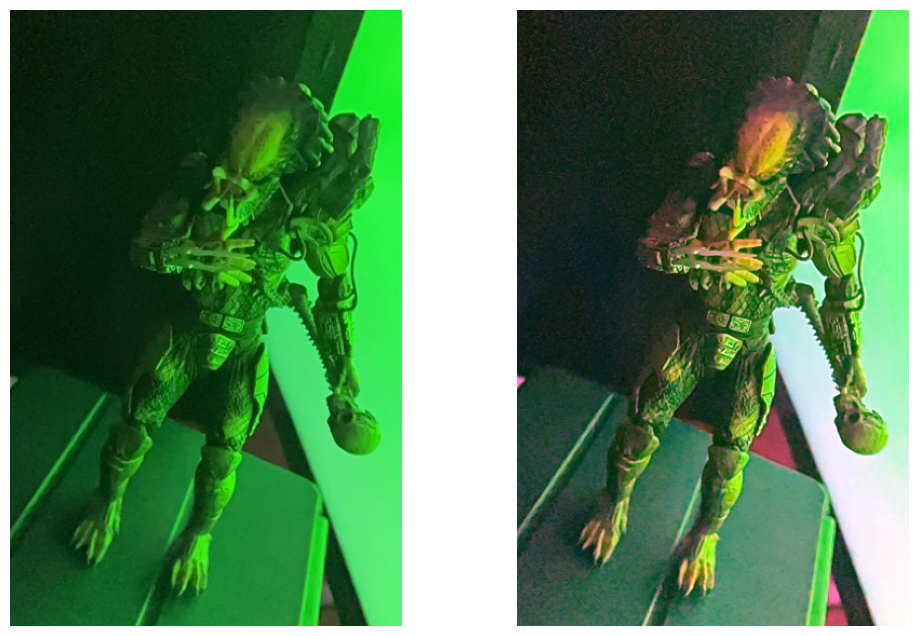

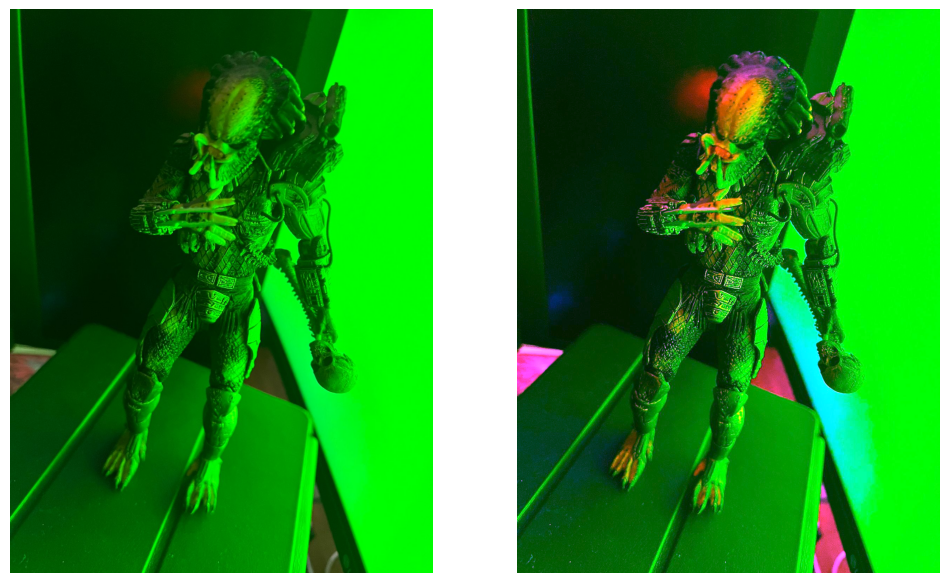

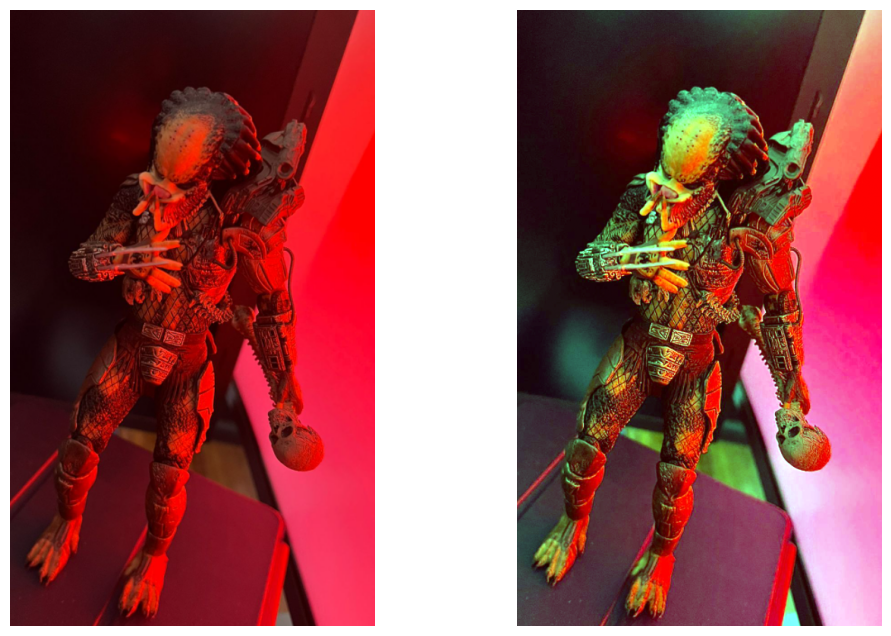

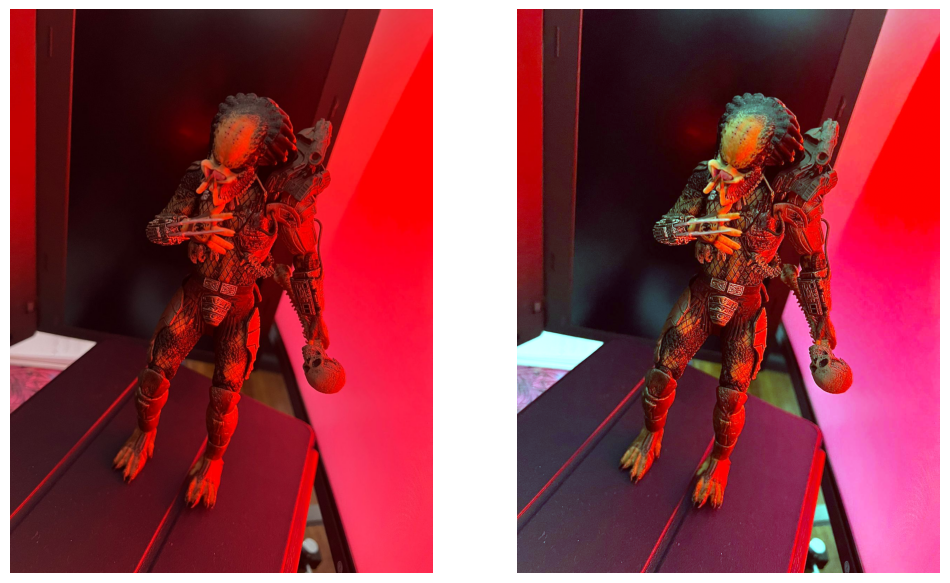

In [144]:
for i in whites:
    show_image_list([i,white_patch(i,99)])

## Fallas

el algoritmo de white patch puede fallar, generando aberraciones en las imagenes, vease los siguientes casos

C:\Users\a\AppData\Local\Temp\ipykernel_19184\2410884561.py:9: RuntimeWarning: divide by zero encountered in divide
  return ((channel*1.0)/np.percentile(channel, percentile_value, axis=(0,1))).clip(0, 1)
C:\Users\a\AppData\Local\Temp\ipykernel_19184\2410884561.py:9: RuntimeWarning: invalid value encountered in divide
  return ((channel*1.0)/np.percentile(channel, percentile_value, axis=(0,1))).clip(0, 1)


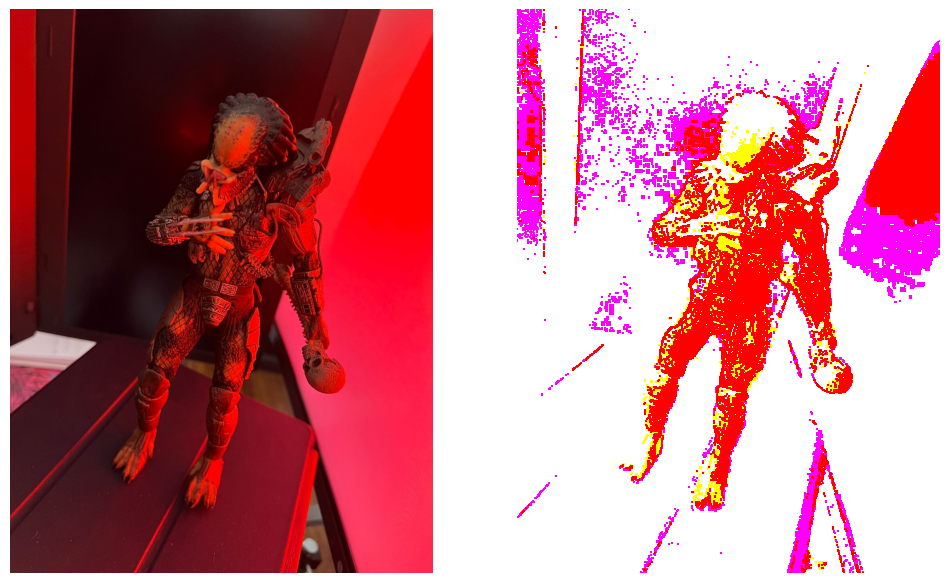

In [145]:
show_image_list([whites[7],white_patch(whites[7],0)])

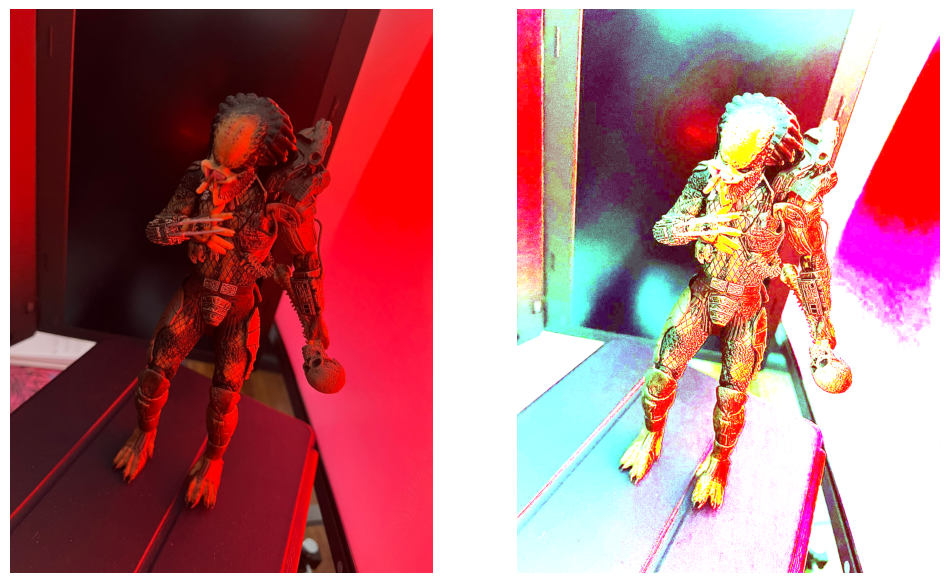

In [146]:
show_image_list([whites[7],white_patch(whites[7],50)])

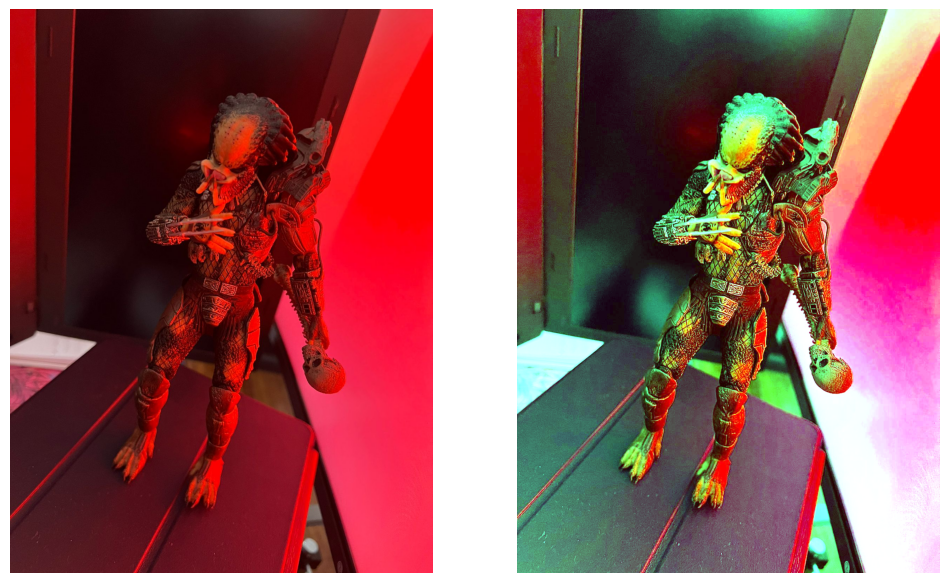

In [147]:
show_image_list([whites[7],white_patch(whites[7],90)])

# Parte II

In [148]:
img1 = open_images("./img1_tp.png", color_scale= cv.COLOR_RGB2GRAY)
img2 = open_images("./img2_tp.png", color_scale= cv.COLOR_RGB2GRAY)

In [149]:
hist1, bins1 = np.histogram(img1.ravel(), 256, [0, 256])
hist2, bins2 = np.histogram(img2.ravel(), 256, [0, 256])

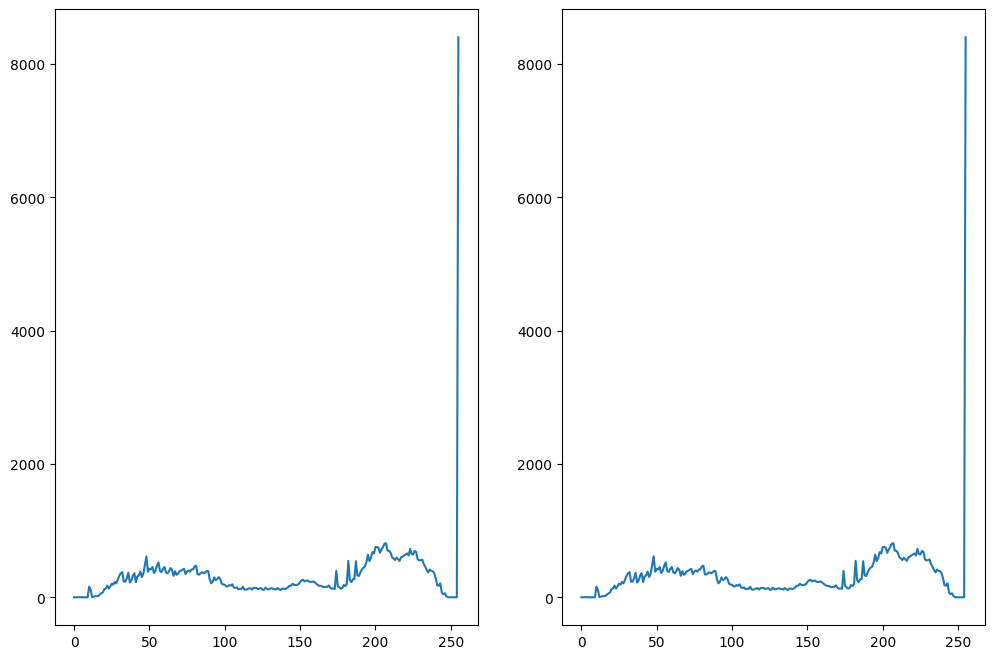

In [150]:
show_plots([hist1,hist2])

In [151]:
np.testing.assert_equal(hist1,hist2)

## Explicacion

Al observar los histogramas de las imagenes se aprecia de su distribucion son identicas, al ejecutar un assert equal de numpy se verifica que en verdad son exactamente identicas

### Parte III

Para la imagen segmentacion.png analice el histograma de los canales RGB. Segmente algunos de los 
elementos presentes en la imagen (agua, cielo, tierra) y muestre, aplicando mascaras, las regiones en imágenes 
separadas.

In [152]:
seg_img = open_images("./segmentacion.png")

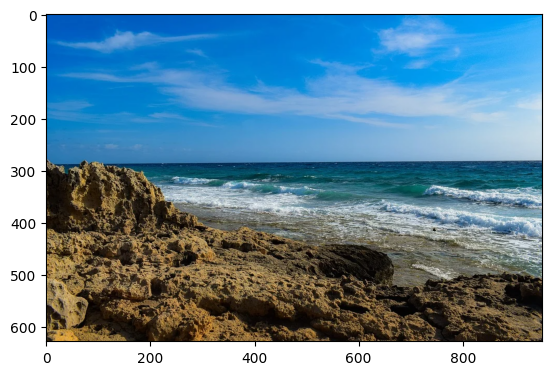

In [153]:
plt.imshow(seg_img)

In [154]:
r,g,b = cv.split(seg_img)

In [155]:
r.shape

(628, 953)

In [156]:
histr, binsr = np.histogram(r.ravel(), 256, [0, 256])
histg, binsg = np.histogram(g.ravel(), 256, [0, 256])
histb, binsb = np.histogram(b.ravel(), 256, [0, 256])

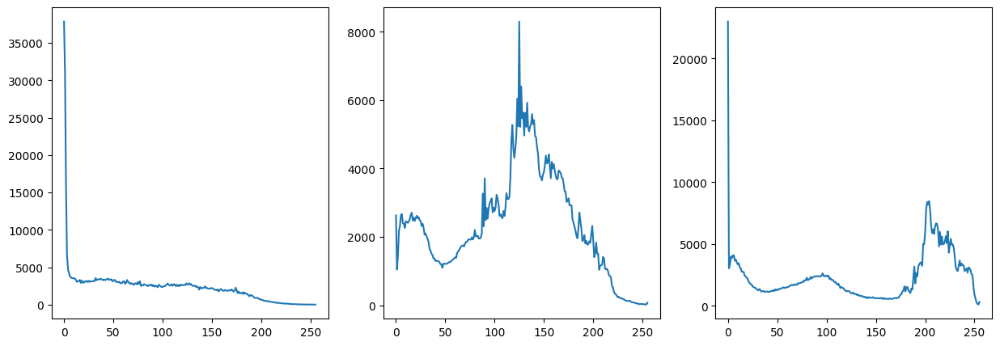

In [157]:
show_plots([histr,histg,histb],figsize=(15,5))

In [158]:
b_hist = cv.calcHist([seg_img], [0], None, [256], [0,256], accumulate=False)
g_hist = cv.calcHist([seg_img], [1], None, [256], [0,256], accumulate=False)
r_hist = cv.calcHist([seg_img], [2], None, [256], [0,256], accumulate=False)

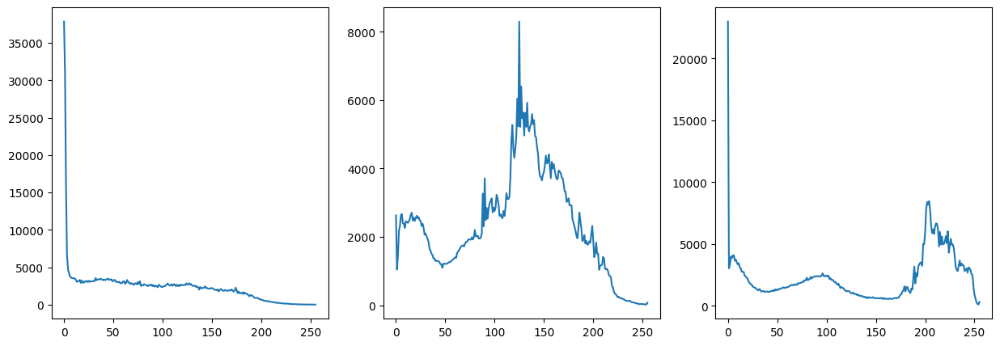

In [159]:
show_plots([b_hist,g_hist,r_hist],figsize=(15,5))

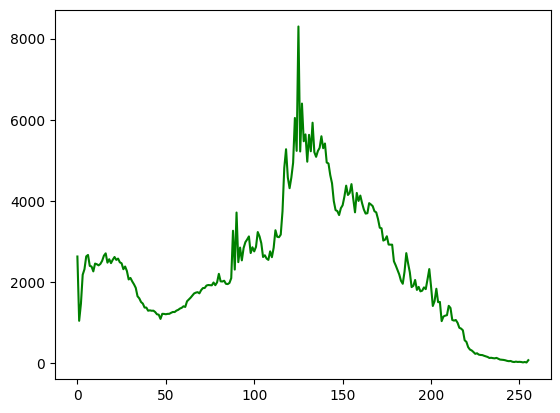

In [160]:
hist = cv.calcHist([seg_img], [0, 2], None, [180, 256], [0, 180, 0, 255])
plt.figure()
plt.plot(g_hist, color = 'g')
plt.show()

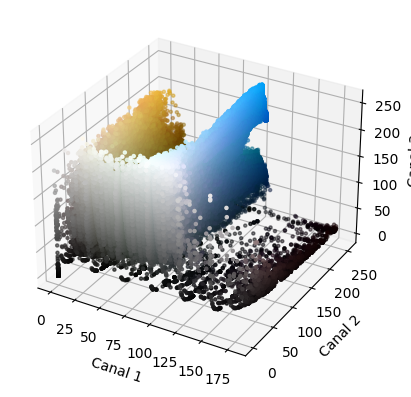

In [161]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import colors

img_HSV = cv.cvtColor(seg_img, cv.COLOR_RGB2HSV)

#c1, c2, c3 = cv.split(seg_img)
c1, c2, c3 = cv.split(img_HSV)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

pixel_colors = seg_img.reshape((np.shape(seg_img)[0]*np.shape(seg_img)[1], 3))
norm = colors.Normalize(vmin=-1.,vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()

axis.scatter(c1.flatten(), c2.flatten(), c3.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Canal 1")
axis.set_ylabel("Canal 2")
axis.set_zlabel("Canal 3")
plt.show()

In [162]:
hsv_img = cv.cvtColor(seg_img, cv.COLOR_RGB2HSV)

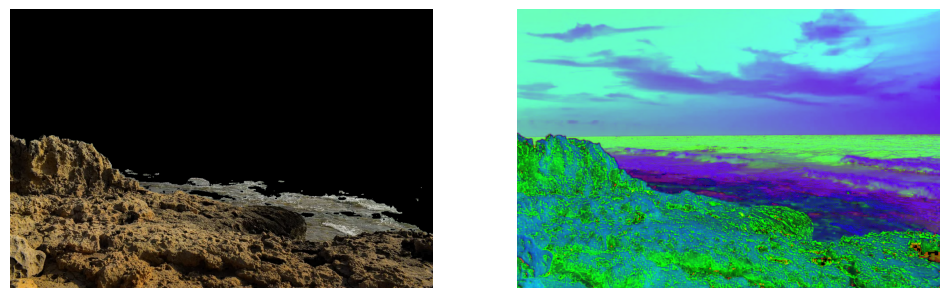

In [163]:
color_mask_bg = (0,0,0)
color = (50,255,255)

mask = cv.inRange(hsv_img,color_mask_bg,color)
segmented = cv.bitwise_and(seg_img,seg_img,mask=mask)
show_image_list([segmented,hsv_img])

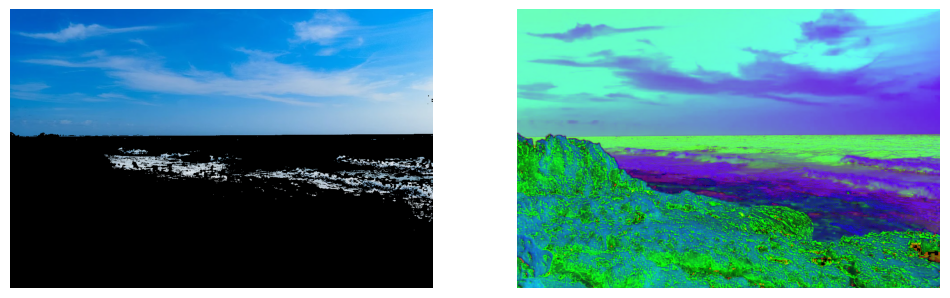

In [164]:
color_lower = (100,0,170)
color_upper = (170,255,255)

mask = cv.inRange(hsv_img,color_lower,color_upper)
segmented = cv.bitwise_and(seg_img,seg_img,mask=mask)
show_image_list([segmented,hsv_img])

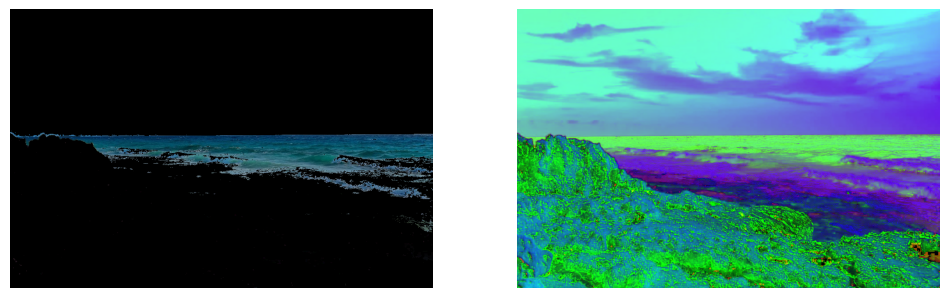

In [165]:
color_lower = (50,50,0)
color_upper = (170,255,170)

mask = cv.inRange(hsv_img,color_lower,color_upper)
segmented = cv.bitwise_and(seg_img,seg_img,mask=mask)
show_image_list([segmented,hsv_img])